In [1]:
# TensorFlow and tf.keras
import tensorflow as tf
from tensorflow import keras

# Helper libraries
import numpy as np
import matplotlib.pyplot as plt

import tensorflow_datasets as tfds

import copy
import cv2
from PIL import Image

In [2]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [3]:
# 데이터셋 다운로드
(ds_train, ds_test), ds_info = tfds.load(
    'stanford_dogs',
    split=['train', 'test'],
    shuffle_files=True,
    with_info=True,
)

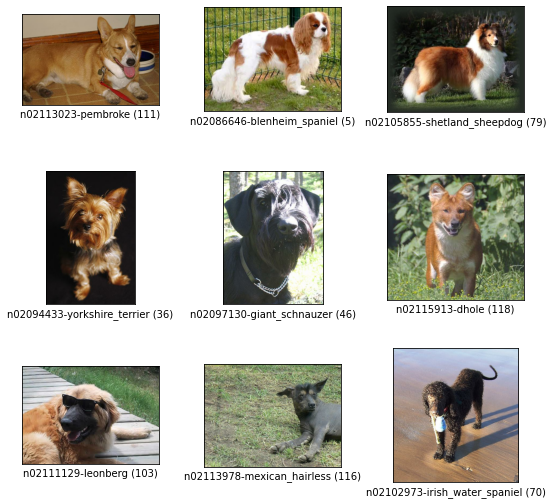

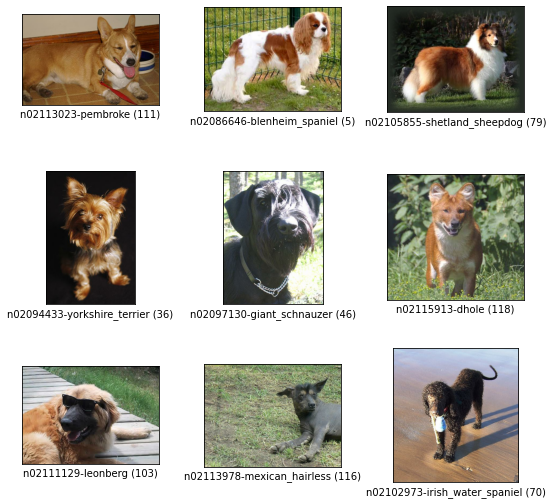

In [4]:
tfds.show_examples(ds_train, ds_info)

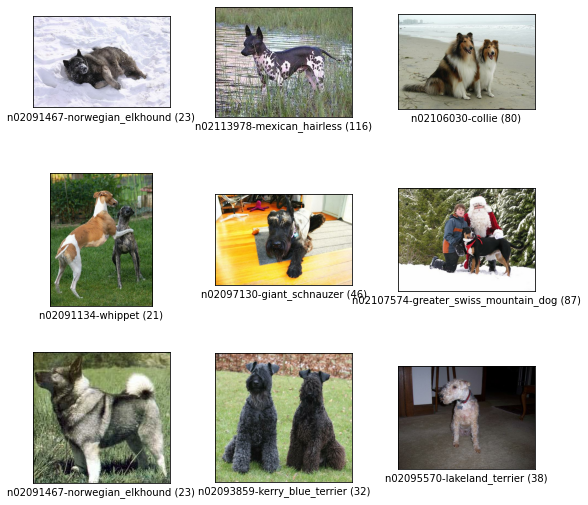

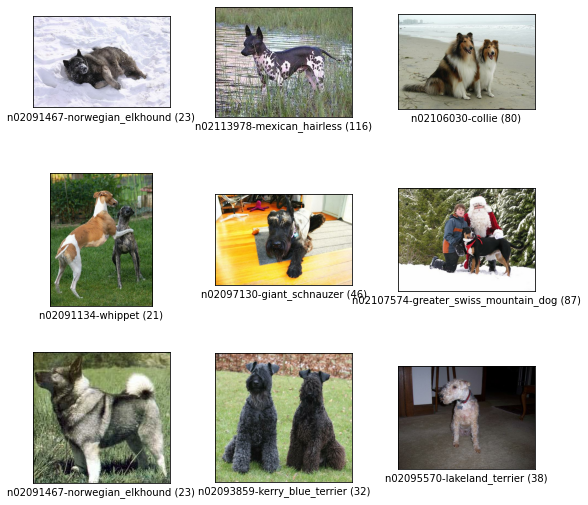

In [5]:
tfds.show_examples(ds_test, ds_info)

In [6]:
# features가 어떻게 구성되어 있는지 확인
ds_info.features

FeaturesDict({
    'image': Image(shape=(None, None, 3), dtype=tf.uint8),
    'image/filename': Text(shape=(), dtype=tf.string),
    'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=120),
    'objects': Sequence({
        'bbox': BBoxFeature(shape=(4,), dtype=tf.float32),
    }),
})

In [4]:
# 데이터 전처리
def normalize_and_resize_img(input):
    # Normalizes images: `uint8` -> `float32`
    image = tf.image.resize(input['image'], [224, 224])
    input['image'] = tf.cast(image, tf.float32) / 255.
    return input['image'], input['label']

def apply_normalize_on_dataset(ds, is_test=False, batch_size=16):
    ds = ds.map(
        normalize_and_resize_img, 
        num_parallel_calls=2
    )
    ds = ds.batch(batch_size)
    '''
    if not is_test:
        ds = ds.repeat()
        ds = ds.shuffle(200)
    '''
    ds = ds.prefetch(tf.data.experimental.AUTOTUNE)
    return ds

In [5]:
# 데이터셋에서 이미지 한 장씩 뽑기
# CAM 생성 작업은 데이터셋 배치 단위가 아니라 개별 이미지 데이터 단위로 이루어지기 때문
def get_one(ds):
    ds = ds.take(1)
    sample_data = list(ds.as_numpy_iterator())
    bbox = sample_data[0]['objects']['bbox']
    image = sample_data[0]['image']
    label = sample_data[0]['label']
    return sample_data[0]

In [9]:
# 데이터셋에 전처리와 배치처리를 적용
ds_train_norm = apply_normalize_on_dataset(ds_train)
ds_val_norm = apply_normalize_on_dataset(ds_test)

# 구성된 배치의 모양을 확인
for input in ds_train_norm.take(1):
    image, label = input
    print(image.shape)
    print(label.shape)

(16, 224, 224, 3)
(16,)


## CAM 구현

In [10]:
num_classes = ds_info.features["label"].num_classes

# cam 모델
base_model = keras.applications.resnet50.ResNet50(
    include_top=False,    # Imagenet 분류기  fully connected layer 제거
    weights='imagenet',
    input_shape=(224, 224, 3),
    pooling='avg',      # GAP(Global Average Pooling)를 적용  
)
x = base_model.output
preds = keras.layers.Dense(num_classes, activation='softmax')(x)
cam_model = keras.Model(inputs=base_model.input, outputs=preds)

cam_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
______________________________________________________________________________________________

In [11]:
EPOCH = 20

cam_model.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.01),
    metrics=['accuracy'],
)

history_cam_model = cam_model.fit(
    ds_train_norm,
    steps_per_epoch=int(ds_info.splits['train'].num_examples/16),
    validation_steps=int(ds_info.splits['test'].num_examples/16),
    epochs=EPOCH,
    validation_data=ds_val_norm,
    verbose=1,
    use_multiprocessing=True,
)

Epoch 1/20
750/750 [==============================] - 170s 215ms/step - loss: 2.2620 - accuracy: 0.4254 - val_loss: 3.3958 - val_accuracy: 0.2015
Epoch 2/20
750/750 [==============================] - 161s 215ms/step - loss: 0.6252 - accuracy: 0.8348 - val_loss: 1.2457 - val_accuracy: 0.6362
Epoch 3/20
750/750 [==============================] - 161s 214ms/step - loss: 0.1586 - accuracy: 0.9777 - val_loss: 0.9851 - val_accuracy: 0.7111
Epoch 4/20
750/750 [==============================] - 161s 214ms/step - loss: 0.0544 - accuracy: 0.9973 - val_loss: 0.9368 - val_accuracy: 0.7284
Epoch 5/20
750/750 [==============================] - 161s 214ms/step - loss: 0.0269 - accuracy: 0.9990 - val_loss: 0.9527 - val_accuracy: 0.7296
Epoch 6/20
750/750 [==============================] - 161s 214ms/step - loss: 0.0175 - accuracy: 0.9994 - val_loss: 0.9854 - val_accuracy: 0.7247
Epoch 7/20
750/750 [==============================] - 161s 214ms/step - loss: 0.0134 - accuracy: 0.9997 - val_loss: 0.9515 -

In [12]:
cam_model_path = 'cam_model.h5'
cam_model.save(cam_model_path)
print("save complete")

/opt/conda/lib/python3.9/site-packages/keras/utils/generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


save complete


In [6]:
def generate_cam(model, item):
    item = copy.deepcopy(item)
    width = item['image'].shape[1]
    height = item['image'].shape[0]
    
    img_tensor, class_idx = normalize_and_resize_img(item)

    cam_model = tf.keras.models.Model([model.inputs], [model.layers[-3].output, model.output])
    conv_outputs, predictions = cam_model(tf.expand_dims(img_tensor, 0))
    conv_outputs = conv_outputs[0, :, :, :]

    class_weights = model.layers[-1].get_weights()[0] 
    
    cam_image = np.zeros(dtype=np.float32, shape=conv_outputs.shape[0:2])
    for i, w in enumerate(class_weights[:, class_idx]):
        cam_image += w * conv_outputs[:, :, i]

    cam_image /= np.max(cam_image)
    cam_image = cam_image.numpy()
    cam_image = cv2.resize(cam_image, (width, height))
    
    return cam_image

In [7]:
cam_model_path = 'cam_model.h5'
cam_model = tf.keras.models.load_model(cam_model_path)

11


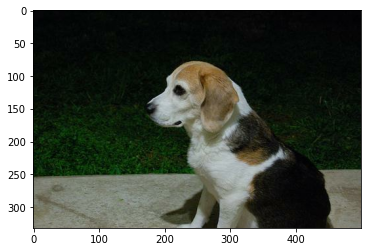

In [20]:
item = get_one(ds_test)
print(item['label'])
plt.imshow(item['image'])
plt.show()

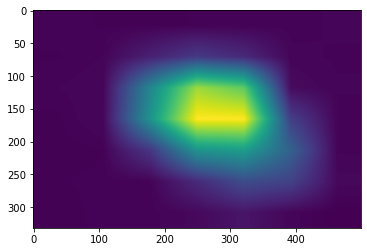

In [21]:
cam_image = generate_cam(cam_model, item)
plt.imshow(cam_image)

In [22]:
# CAM 이미지를 원본 이미지와 합치기
def visualize_cam_on_image(src1, src2, alpha=0.5):
    beta = (1.0 - alpha)
    merged_image = cv2.addWeighted(src1, alpha, src2, beta, 0.0)
    return merged_image

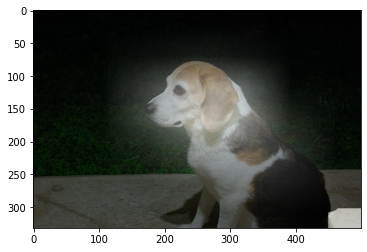

In [23]:
origin_image = item['image'].astype(np.uint8)
cam_image_3channel = np.stack([cam_image*255]*3, axis=-1).astype(np.uint8)

blended_image = visualize_cam_on_image(cam_image_3channel, origin_image)
plt.imshow(blended_image)

## Grad-CAM 구현

In [24]:
def generate_grad_cam(model, activation_layer, item):
    item = copy.deepcopy(item)
    width = item['image'].shape[1]
    height = item['image'].shape[0]
    img_tensor, class_idx = normalize_and_resize_img(item)

    grad_model = tf.keras.models.Model([model.inputs], [model.get_layer(activation_layer).output, model.output])

    with tf.GradientTape() as tape:
        conv_output, pred = grad_model(tf.expand_dims(img_tensor, 0))
    
        loss = pred[:, class_idx] 
        output = conv_output[0] 
        grad_val = tape.gradient(loss, conv_output)[0]

    weights = np.mean(grad_val, axis=(0, 1))
    grad_cam_image = np.zeros(dtype=np.float32, shape=conv_output.shape[0:2])
    for k, w in enumerate(weights):
        grad_cam_image += w * output[:, :, k]
        
    grad_cam_image = tf.math.maximum(0, grad_cam_image)
    grad_cam_image /= np.max(grad_cam_image)
    grad_cam_image = grad_cam_image.numpy()
    grad_cam_image = cv2.resize(grad_cam_image, (width, height))
    
    return grad_cam_image

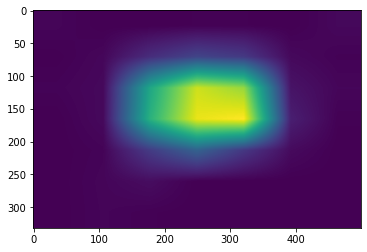

In [27]:
grad_cam_image = generate_grad_cam(cam_model, 'conv5_block3_out', item)
plt.imshow(grad_cam_image)
plt.show()

## 바운딩 박스 구하기

In [28]:
def get_bbox(cam_image, score_thresh=0.1):
    low_indicies = cam_image <= score_thresh
    cam_image[low_indicies] = 0
    cam_image = (cam_image*255).astype(np.uint8)
    
    contours,_ = cv2.findContours(cam_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    cnt = contours[0]
    rotated_rect = cv2.minAreaRect(cnt)
    rect = cv2.boxPoints(rotated_rect)
    rect = np.int0(rect)
    
    return rect

In [29]:
rect = get_bbox(cam_image)
rect

array([[ 89, 229],
       [150,  17],
       [473, 109],
       [412, 321]])

In [31]:
item['objects']['bbox'][0]

array([0.22289157, 0.326     , 0.9909639 , 0.916     ], dtype=float32)

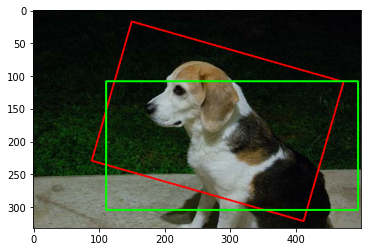

In [37]:
image = copy.deepcopy(item['image'])

# predict bbox
image = cv2.drawContours(image, [rect], 0, (255,0,0), 2)

# ground truth bbox
gt_bbox = item['objects']['bbox'][0]
h, w = image.shape[:2]
x1 = int(gt_bbox[0] * w)
y1 = int(gt_bbox[1] * h)
x2 = int(gt_bbox[2] * w)
y2 = int(gt_bbox[3] * h)
image = cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)

plt.imshow(image)
plt.show()

## IoU 구하기

In [38]:
def rect_to_minmax(rect, image):
    bbox = [
        rect[:,1].min()/float(image.shape[0]),  #bounding box의 y_min
        rect[:,0].min()/float(image.shape[1]),  #bounding box의 x_min
        rect[:,1].max()/float(image.shape[0]), #bounding box의 y_max
        rect[:,0].max()/float(image.shape[1]) #bounding box의 x_max
    ]
    return bbox

In [39]:
pred_bbox = rect_to_minmax(rect, item['image'])
pred_bbox

[0.05120481927710843, 0.178, 0.9668674698795181, 0.946]

In [40]:
item['objects']['bbox']

array([[0.22289157, 0.326     , 0.9909639 , 0.916     ]], dtype=float32)

In [41]:
def get_iou(boxA, boxB):
    y_min = max(boxA[0], boxB[0])
    x_min= max(boxA[1], boxB[1])
    y_max = min(boxA[2], boxB[2])
    x_max = min(boxA[3], boxB[3])
    
    interArea = max(0, x_max - x_min) * max(0, y_max - y_min)
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    iou = interArea / float(boxAArea + boxBArea - interArea)

    return iou

In [42]:
get_iou(pred_bbox, item['objects']['bbox'][0])

0.6118173673362622

## 실험

In [43]:
# grad-cam 여러 장 만들기
def generate_grad_cams(cam_model, layers, item, figsize=(15, 5)):
    grad_cam_images = [generate_grad_cam(cam_model, layer, item) for layer in layers]

    fig, axes = plt.subplots(1, len(layers), figsize=figsize)
    for ax, grad_cam, layer_name in zip(axes, grad_cam_images, layers):
        ax.imshow(grad_cam)
        ax.set_title(layer_name)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

    return grad_cam_images

In [50]:
# 바운딩 박스, IoU 수행하고 이미지별 IoU값 막대 그래프 비교
def get_bbox_iou(cam_images, figsize=(15, 5)):
    ious = []
    n = len(cam_images)
    fig, axes = plt.subplots(1, n, figsize=figsize)
    for ax, img in zip(axes, cam_images):
        rect = get_bbox(img)
        
        # predict bbox
        image = copy.deepcopy(item['image'])
        image = cv2.drawContours(image, [rect], 0, (0,0,255), 2)
        
        # ground truth bbox
        gt_bbox = item['objects']['bbox'][0]
        h, w = image.shape[:2]
        x1 = int(gt_bbox[0] * w)
        y1 = int(gt_bbox[1] * h)
        x2 = int(gt_bbox[2] * w)
        y2 = int(gt_bbox[3] * h)
        image = cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
        
        pred_bbox = rect_to_minmax(rect, item['image'])
        iou = get_iou(pred_bbox, item['objects']['bbox'][0])
        ious.append(iou)
        
        ax.imshow(image)
        ax.set_title(f'IoU: {iou:.2f}')
        ax.axis('off')
        
    plt.tight_layout()
    plt.show()
    
    # IoU 그래프
    plt.figure(figsize=(10, 4))
    bars = plt.bar(range(n), ious, tick_label=[f'block {i+1}' for i in range(n)], color='skyblue')
    for bar, iou in zip(bars, ious):
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, height + 0.02, f'{iou:.2f}', ha='center', va='bottom', fontsize=10)
    plt.ylim(0, 1)
    plt.title('IoU per Image')
    plt.ylabel('IoU')
    plt.xlabel('block num')
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.show()
    
    return ious

### 1. Grad-CAM ResNet50 stage별 비교

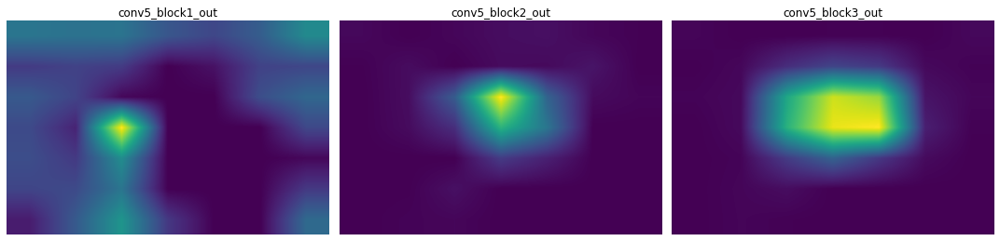

In [123]:
layers = ['conv5_block1_out', 'conv5_block2_out', 'conv5_block3_out']

grad_cam_images = generate_grad_cams(cam_model, layers, item)

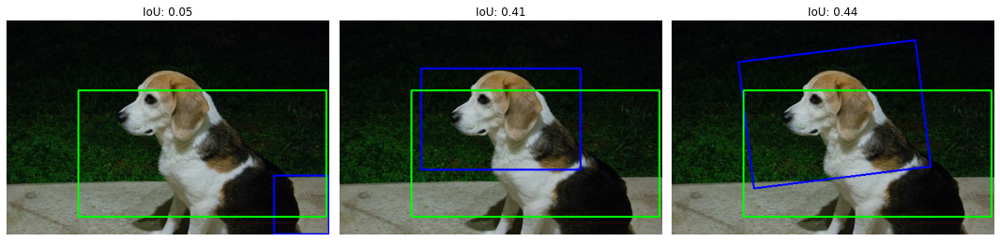

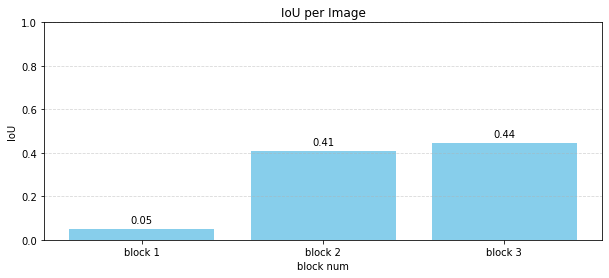

In [124]:
ious = get_bbox_iou(grad_cam_images)

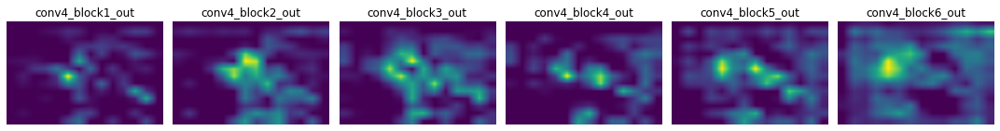

In [125]:
layers = ['conv4_block1_out', 'conv4_block2_out', 'conv4_block3_out', 'conv4_block4_out', 'conv4_block5_out','conv4_block6_out']

grad_cam_images = generate_grad_cams(cam_model, layers, item)

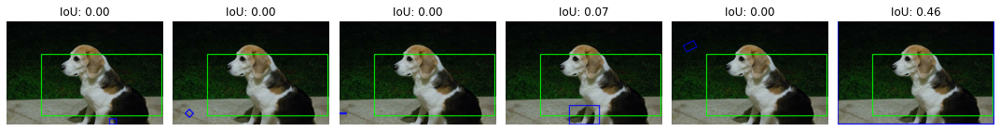

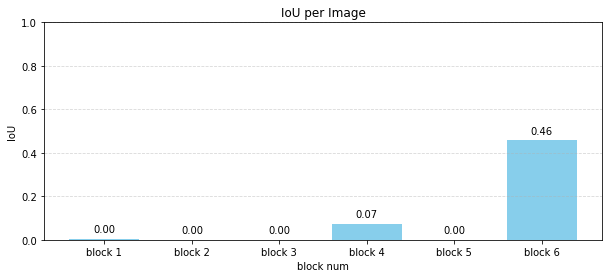

In [126]:
ious = get_bbox_iou(grad_cam_images)

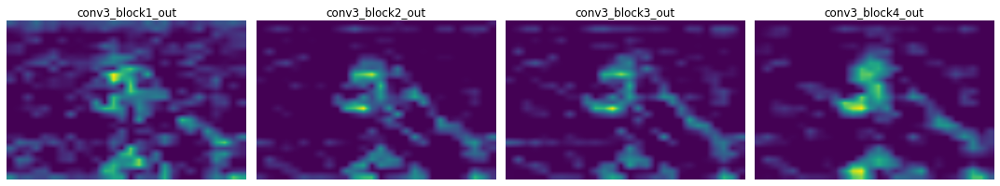

In [127]:
layers = ['conv3_block1_out', 'conv3_block2_out', 'conv3_block3_out', 'conv3_block4_out']

grad_cam_images = generate_grad_cams(cam_model, layers, item)

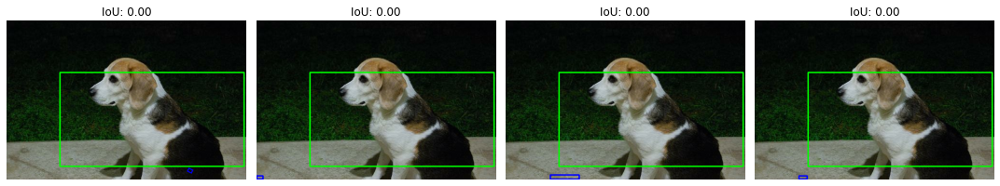

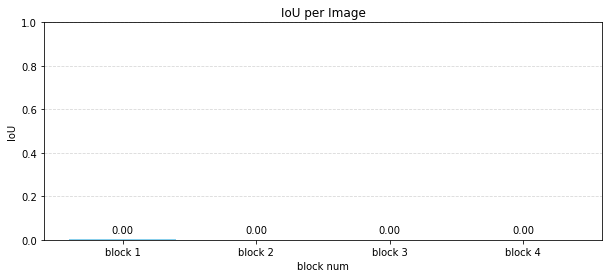

In [128]:
ious = get_bbox_iou(grad_cam_images)

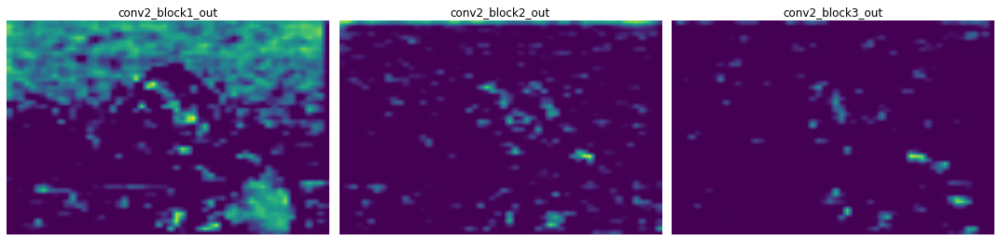

In [129]:
layers = ['conv2_block1_out', 'conv2_block2_out', 'conv2_block3_out']

grad_cam_images = generate_grad_cams(cam_model, layers, item)

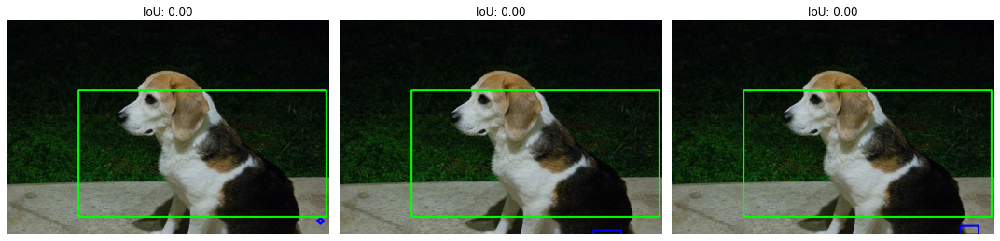

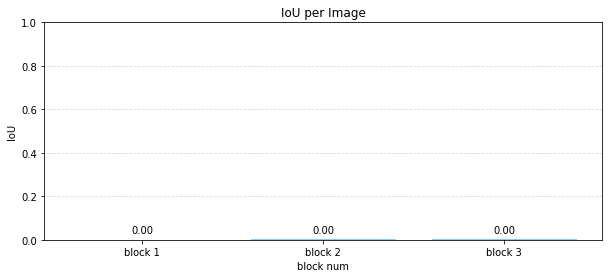

[0.0, 0.002283866623505832, 0.0016033300250345615]


In [130]:
ious = get_bbox_iou(grad_cam_images)
print(ious)

- conv5를 제외한 나머지 stage는 IoU값이 대부분 0.0으로 의미가 없다고 판단하여 더이상 실험을 진행하지 않음

### 2. Grad-CAM ResNet Conv5 block별 비교

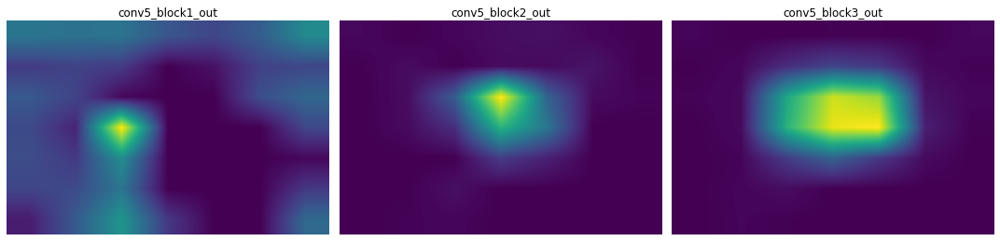

In [53]:
# 대상 블록 이름들
layers = ['conv5_block1_out', 'conv5_block2_out', 'conv5_block3_out']

grad_cam_images = generate_grad_cams(cam_model, layers, item)

In [54]:
block_ious = []

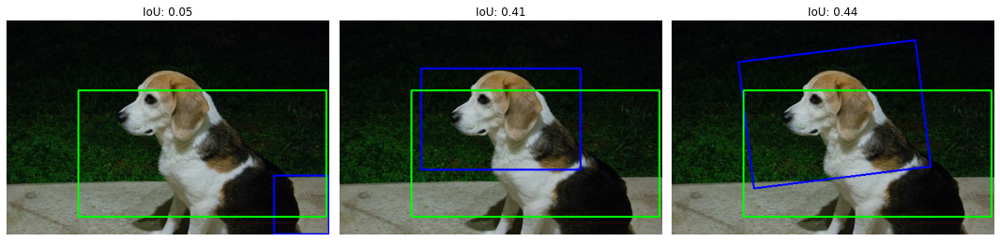

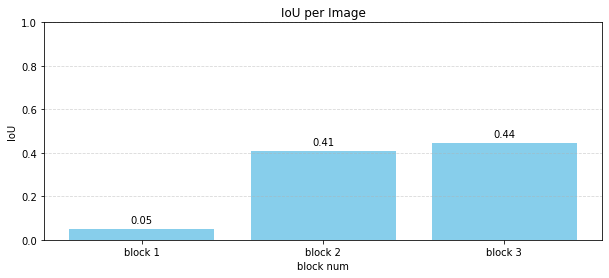

[0.049542031203248835, 0.40686620225086384, 0.44491789054450775]


In [55]:
ious = get_bbox_iou(grad_cam_images)
print(ious)
block_ious.append(ious)

In [63]:
#block_ious.pop()
print(block_ious)

[[0.049542031203248835, 0.40686620225086384, 0.44491789054450775]]


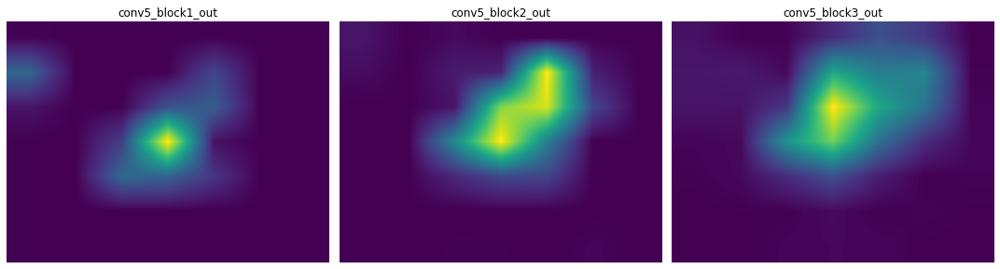

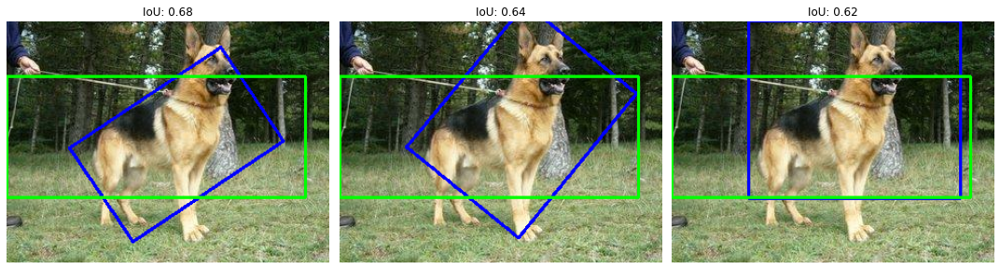

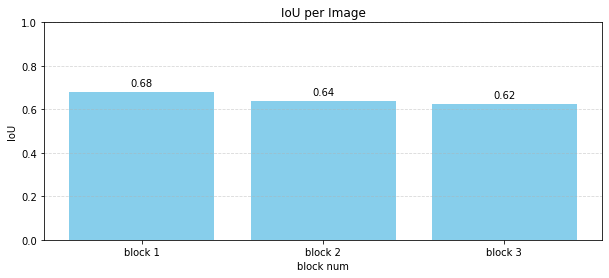

[0.6778470385834194, 0.6368483358351965, 0.6224928059125467]


In [64]:
item = get_one(ds_test)
grad_cam_images = generate_grad_cams(cam_model, layers, item)
ious = get_bbox_iou(grad_cam_images)
print(ious)

In [65]:
block_ious.append(ious)

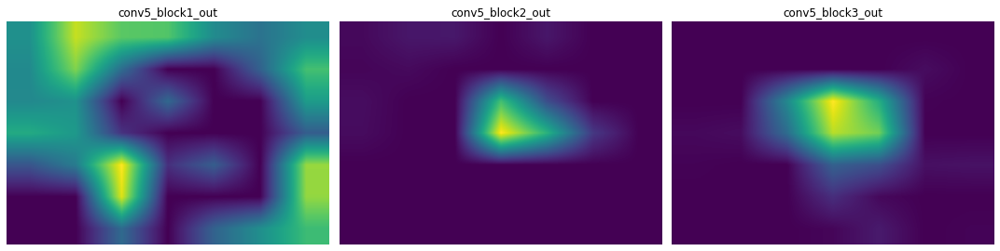

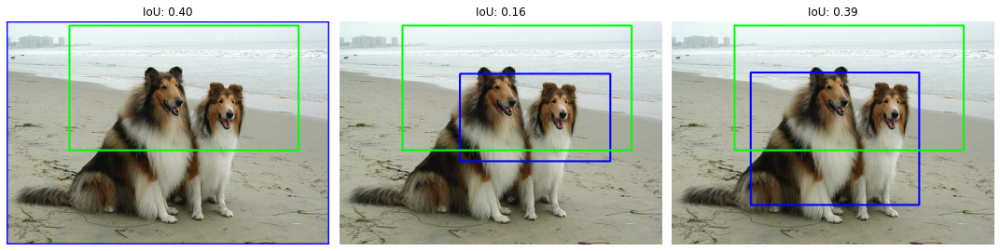

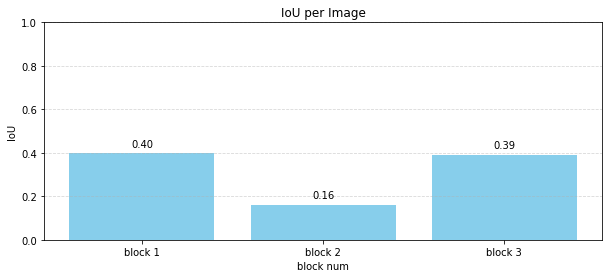

[0.39752338642633633, 0.1622911725574615, 0.39094070568612516]


In [67]:
item = get_one(ds_test)
grad_cam_images = generate_grad_cams(cam_model, layers, item)
ious = get_bbox_iou(grad_cam_images)
print(ious)

In [68]:
block_ious.append(ious)

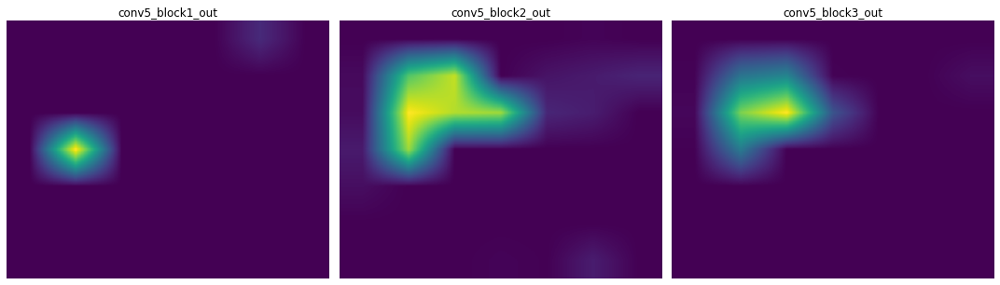

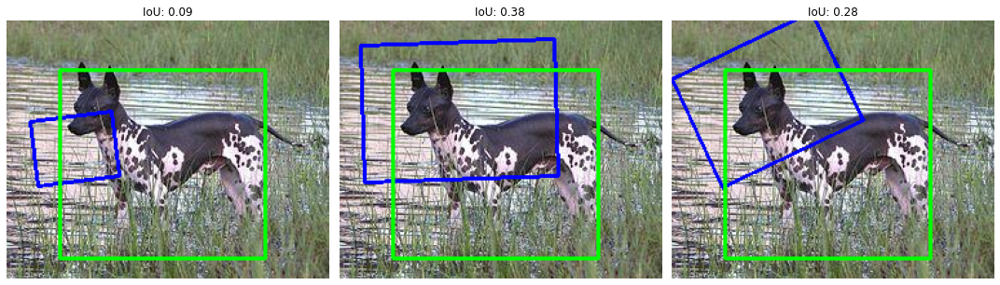

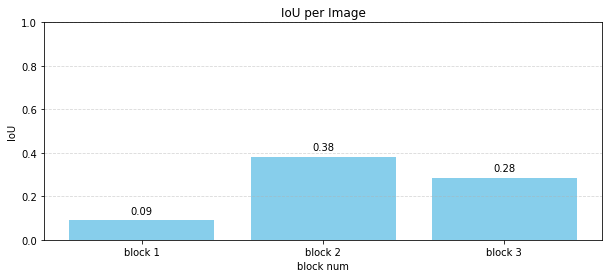

[0.09054881648876262, 0.38264814294093, 0.2842843973759545]


In [69]:
item = get_one(ds_test)
grad_cam_images = generate_grad_cams(cam_model, layers, item)
ious = get_bbox_iou(grad_cam_images)
print(ious)

In [70]:
block_ious.append(ious)

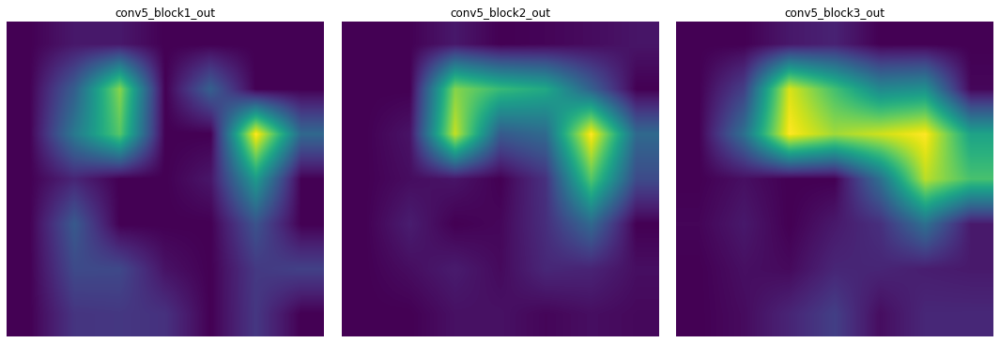

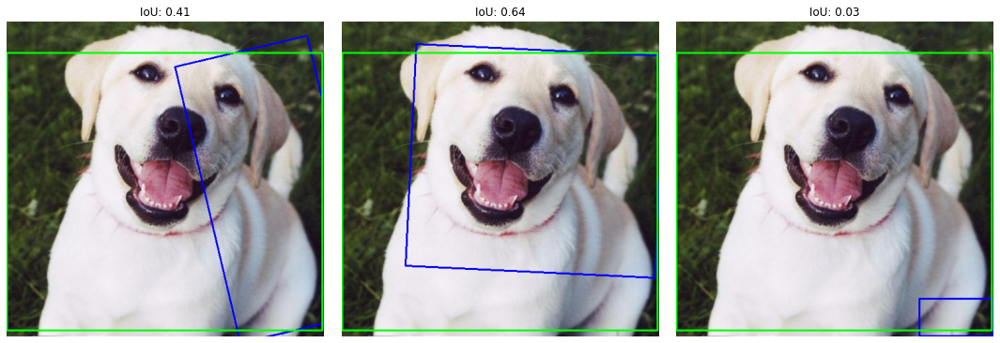

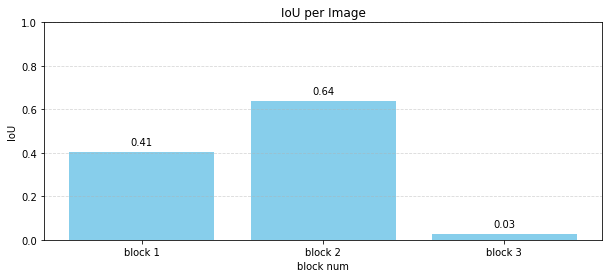

[0.40512763731514695, 0.6390887464782957, 0.028410809093162015]


In [72]:
item = get_one(ds_test)
grad_cam_images = generate_grad_cams(cam_model, layers, item)
ious = get_bbox_iou(grad_cam_images)
print(ious)

In [73]:
block_ious.append(ious)

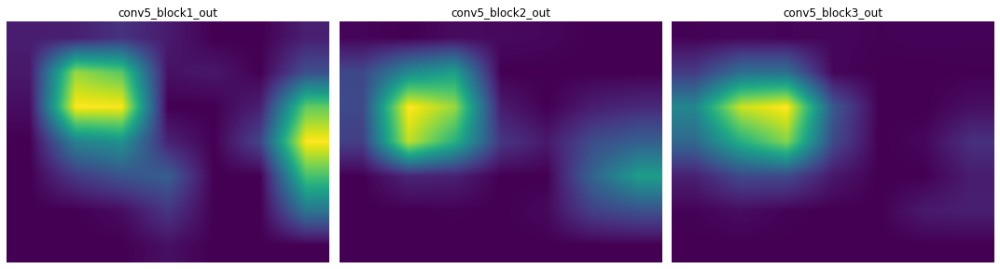

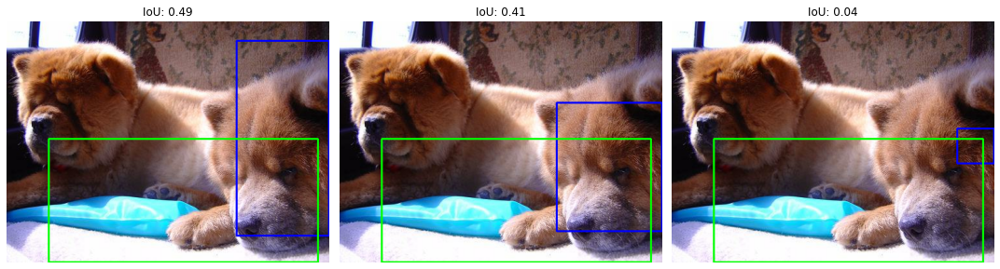

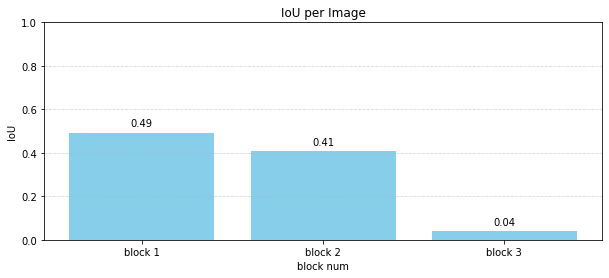

[0.49292989560323985, 0.4064023227941895, 0.038564181322579626]


In [74]:
item = get_one(ds_test)
grad_cam_images = generate_grad_cams(cam_model, layers, item)
ious = get_bbox_iou(grad_cam_images)
print(ious)

In [75]:
block_ious.append(ious)

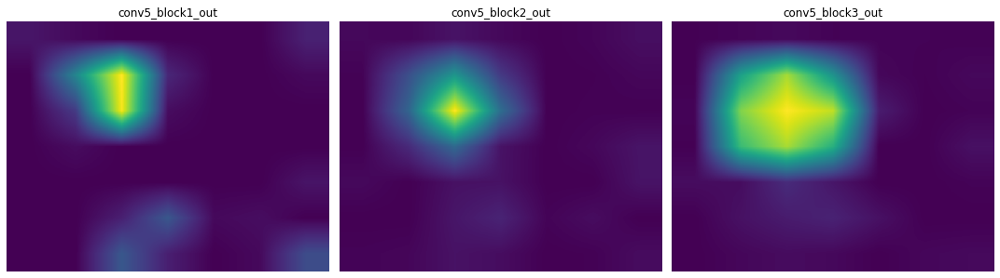

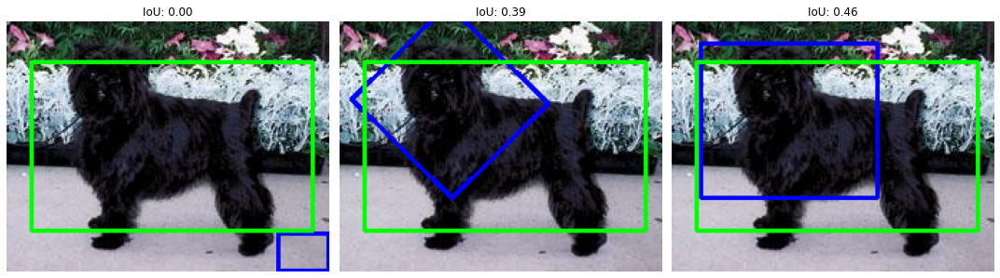

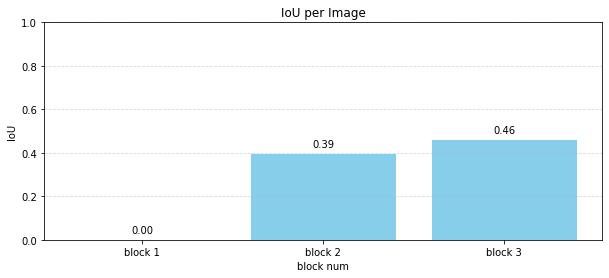

[0.0, 0.394675955767338, 0.4590216376679861]


In [77]:
item = get_one(ds_test)
grad_cam_images = generate_grad_cams(cam_model, layers, item)
ious = get_bbox_iou(grad_cam_images)
print(ious)

In [78]:
block_ious.append(ious)

In [80]:
print(len(block_ious))

7


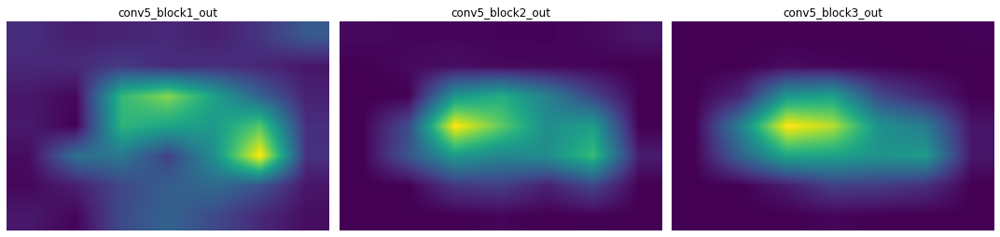

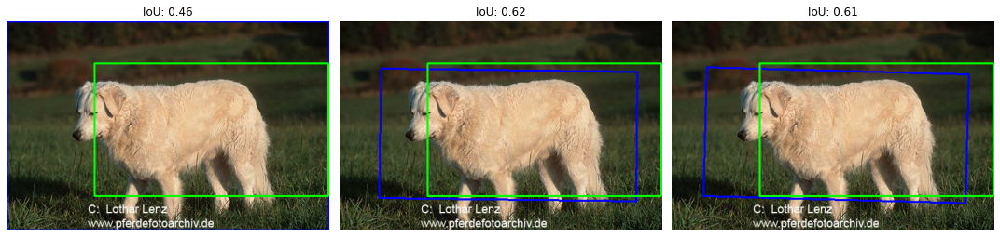

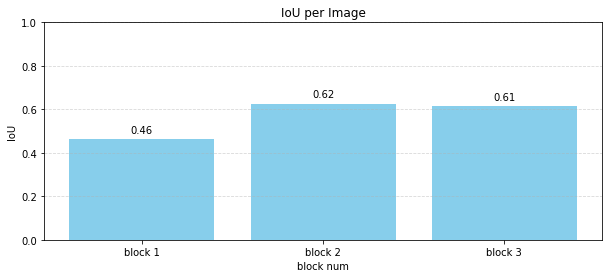

[0.46222076678665597, 0.6247544543911164, 0.6132678176515532]


In [81]:
item = get_one(ds_test)
grad_cam_images = generate_grad_cams(cam_model, layers, item)
ious = get_bbox_iou(grad_cam_images)
print(ious)

In [82]:
block_ious.append(ious)

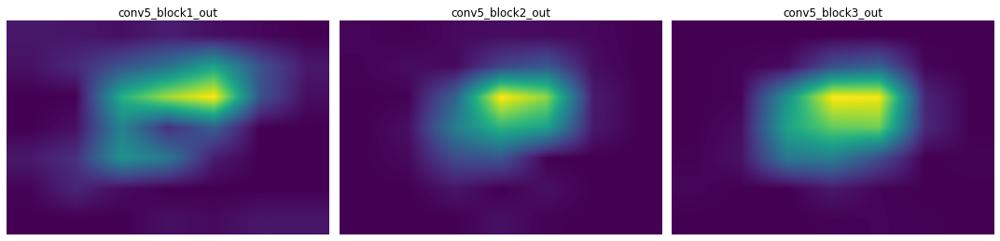

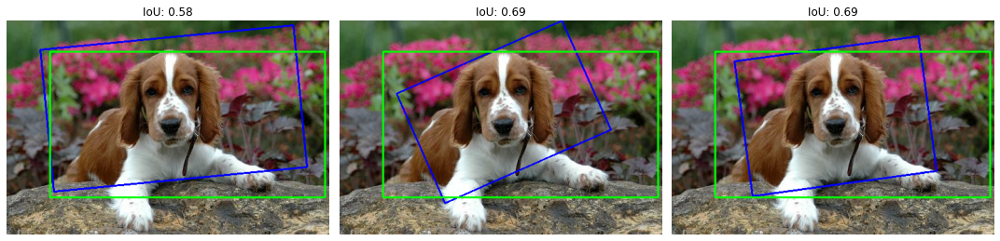

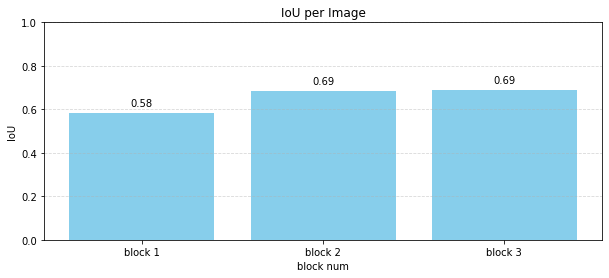

[0.584493663312156, 0.685568897786613, 0.6912046681304383]


In [97]:
item = get_one(ds_test)
grad_cam_images = generate_grad_cams(cam_model, layers, item)
ious = get_bbox_iou(grad_cam_images)
print(ious)

In [98]:
block_ious.append(ious)

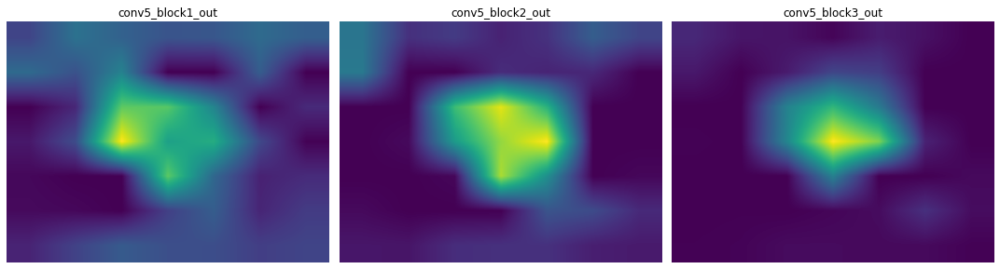

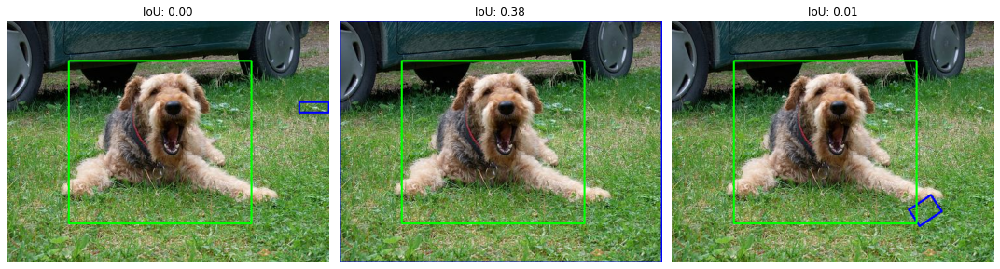

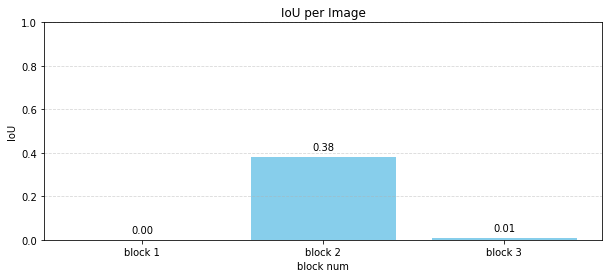

[0.0, 0.382342205335765, 0.010473997826744184]


In [108]:
item = get_one(ds_test)
grad_cam_images = generate_grad_cams(cam_model, layers, item)
ious = get_bbox_iou(grad_cam_images)
print(ious)

In [109]:
block_ious.append(ious)

In [110]:
print(len(block_ious))
print(block_ious)

10
[[0.049542031203248835, 0.40686620225086384, 0.44491789054450775], [0.6778470385834194, 0.6368483358351965, 0.6224928059125467], [0.39752338642633633, 0.1622911725574615, 0.39094070568612516], [0.09054881648876262, 0.38264814294093, 0.2842843973759545], [0.40512763731514695, 0.6390887464782957, 0.028410809093162015], [0.49292989560323985, 0.4064023227941895, 0.038564181322579626], [0.0, 0.394675955767338, 0.4590216376679861], [0.46222076678665597, 0.6247544543911164, 0.6132678176515532], [0.584493663312156, 0.685568897786613, 0.6912046681304383], [0.0, 0.382342205335765, 0.010473997826744184]]


In [113]:
avg1, avg2, avg3 = 0.0, 0.0, 0.0
for block in block_ious:
    avg1 += block[0]
    avg2 += block[1]
    avg3 += block[2]
    
n = len(block_ious)
avg1 /= n
avg2 /= n
avg3 /= n
print(avg1, avg2, avg3)

0.3160233235718966 0.472148643613777 0.35835789112115973


| |conv5_block1|conv5_block2|conv5_block3|
|:---:|:---:|:---:|:---:|
|IoU average|0.31|0.47|0.35|

- Test데이터셋에서 무작위로 10개의 이미지를 뽑아 block 별 IoU값을 비교해봄
- block1,2,3 중 block2가 평균적으로 가장 좋은 성능을 보임

### 3. CAM vs Grad-CAM

In [134]:
# 한 이미지로 cam과 grad-cam 수행 후 바운딩박스, IoU 계산해서 비교
def compare_cam(item):
    cam_image = generate_cam(cam_model, item)
    plt.subplot(1,2,1)
    plt.imshow(cam_image)
    plt.title('CAM')
    plt.axis('off')

    grad_cam_image = generate_grad_cam(cam_model, 'conv5_block2_out', item)   # 이전 실험에서 block2가 가장 좋은 결과를 보여서 사용
    plt.subplot(1,2,2)
    plt.imshow(grad_cam_image)
    plt.title('Grad-CAM')
    plt.axis('off')
 
    plt.tight_layout()
    plt.show()
    
    ious = get_bbox_iou([cam_image, grad_cam_image])
    return ious

In [136]:
model_ious = []

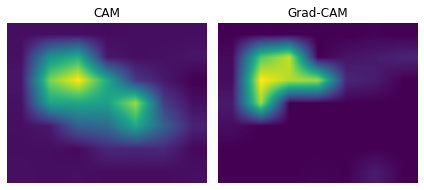

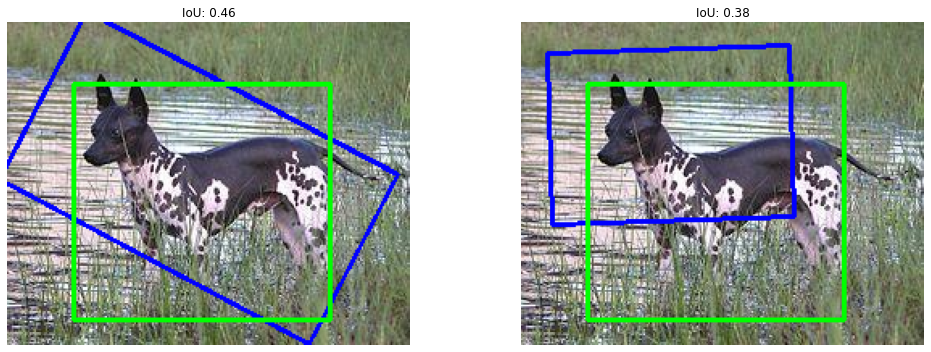

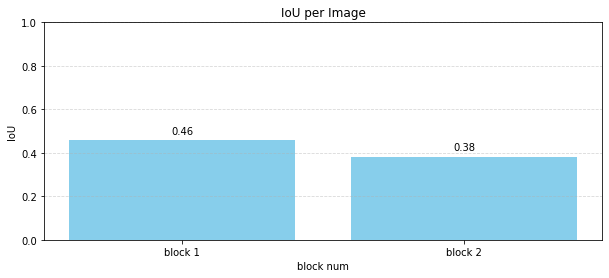

In [137]:
item = get_one(ds_test)
ious = compare_cam(item)

In [138]:
model_ious.append(ious)

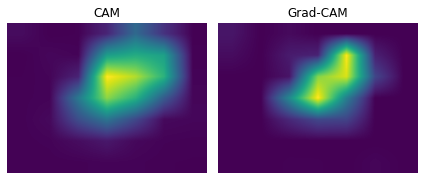

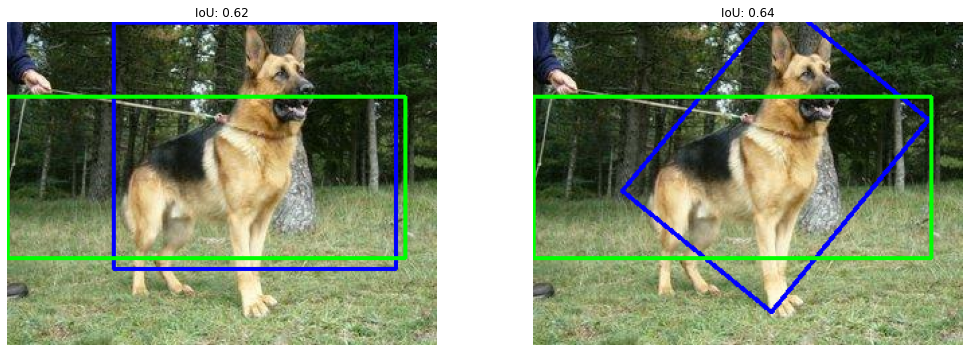

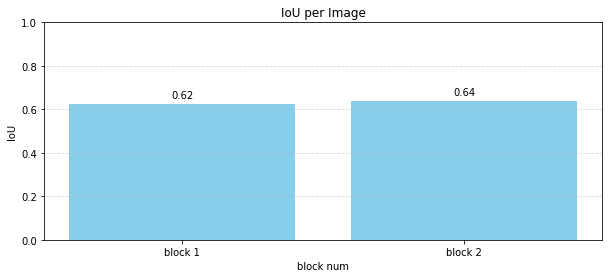

In [139]:
item = get_one(ds_test)
ious = compare_cam(item)

In [140]:
model_ious.append(ious)

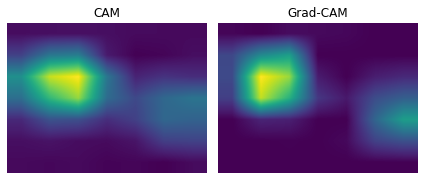

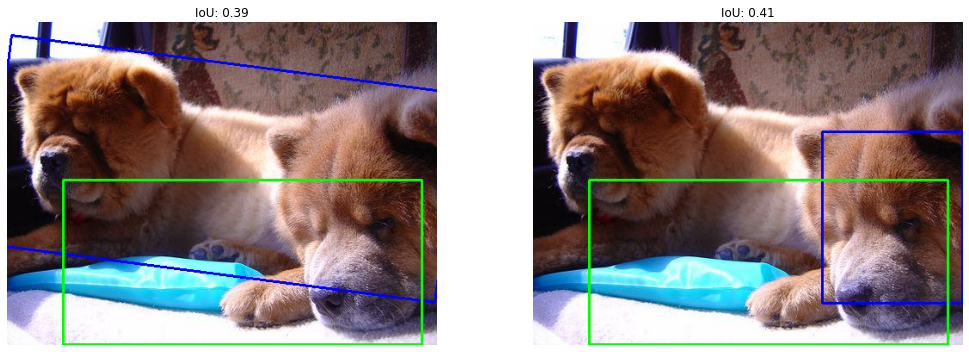

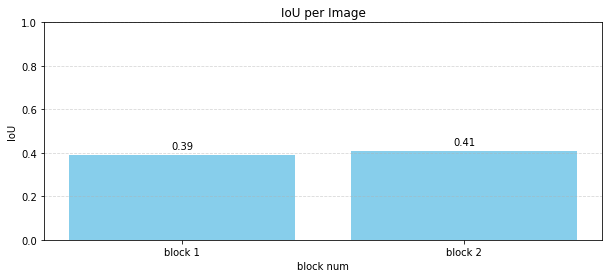

In [142]:
item = get_one(ds_test)
ious = compare_cam(item)

In [143]:
model_ious.append(ious)

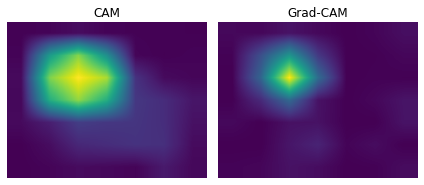

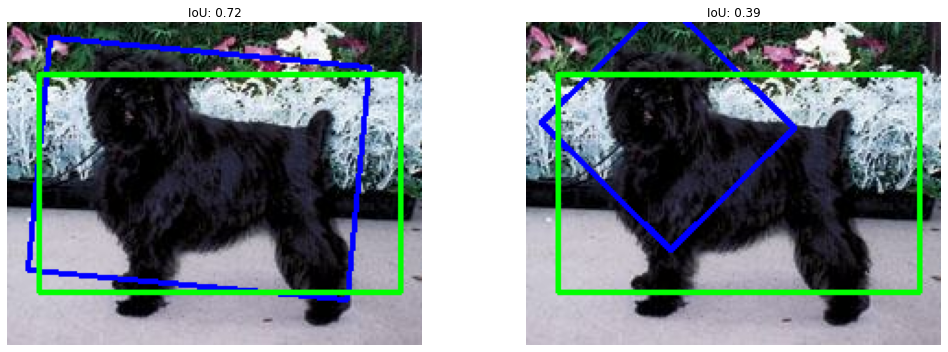

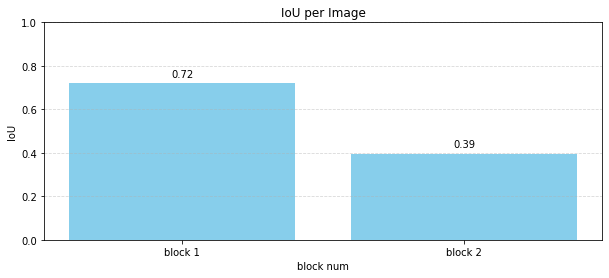

In [144]:
item = get_one(ds_test)
ious = compare_cam(item)

In [145]:
model_ious.append(ious)

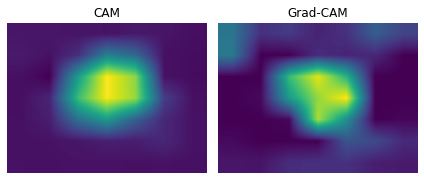

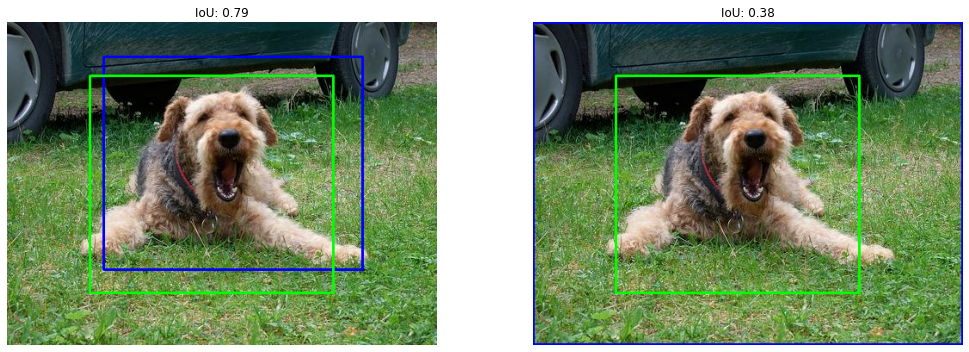

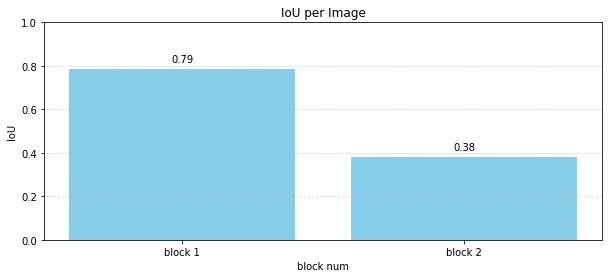

In [149]:
item = get_one(ds_test)
ious = compare_cam(item)

In [150]:
model_ious.append(ious)

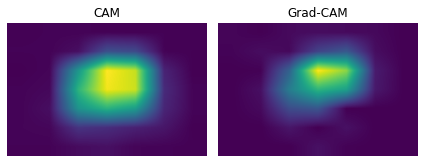

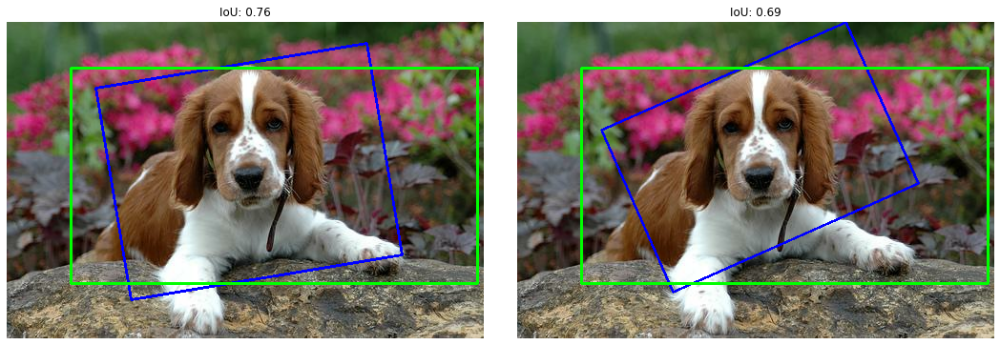

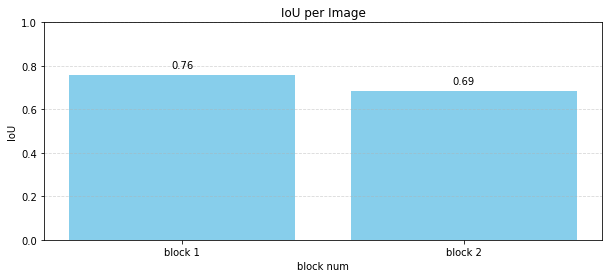

In [151]:
item = get_one(ds_test)
ious = compare_cam(item)

In [152]:
model_ious.append(ious)

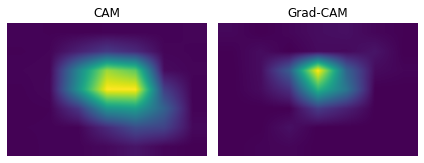

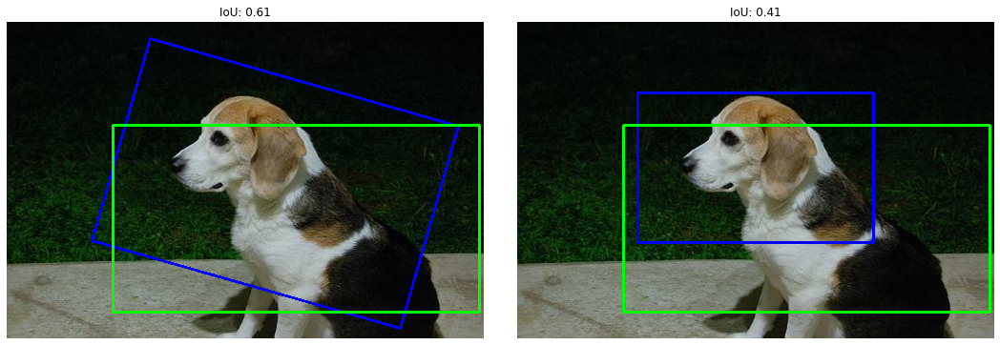

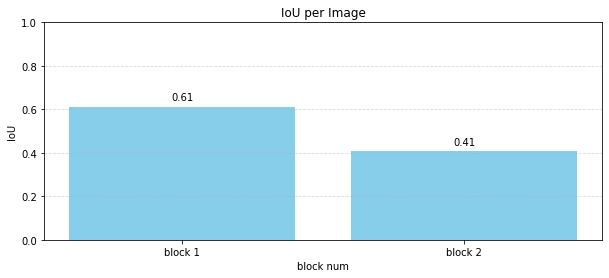

In [166]:
item = get_one(ds_test)
ious = compare_cam(item)

In [167]:
model_ious.append(ious)

In [168]:
print(len(model_ious))

7


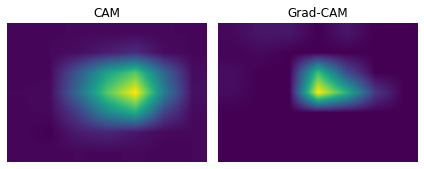

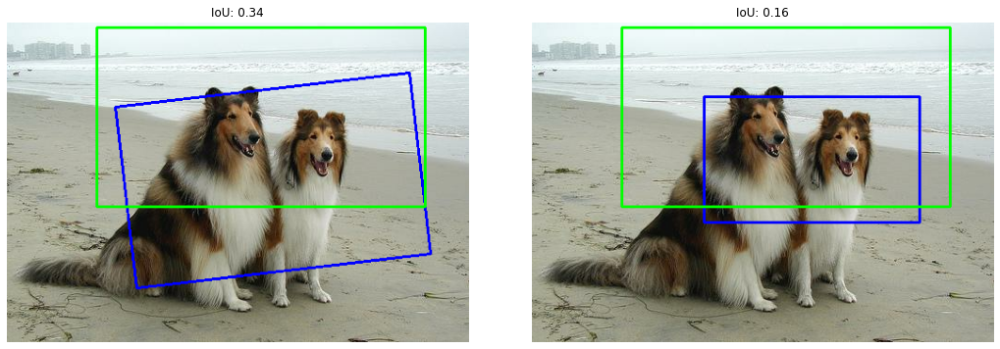

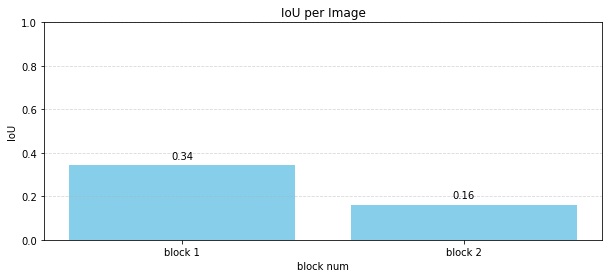

In [176]:
item = get_one(ds_test)
ious = compare_cam(item)

In [177]:
model_ious.append(ious)

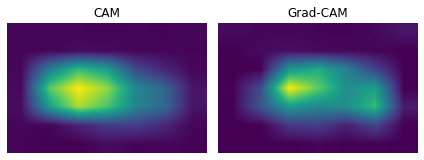

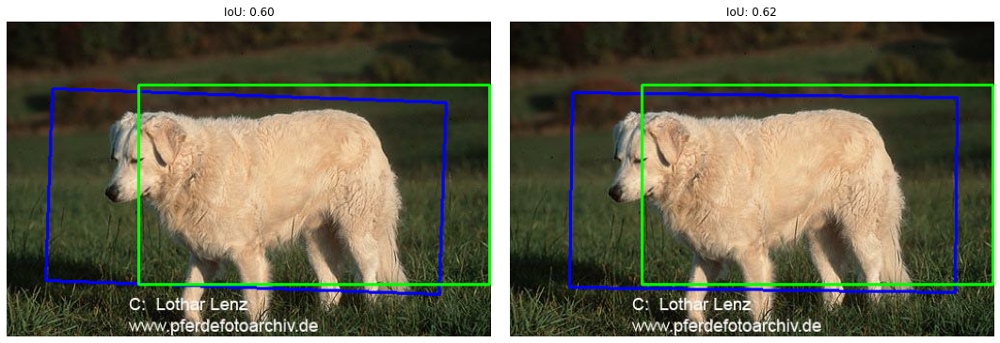

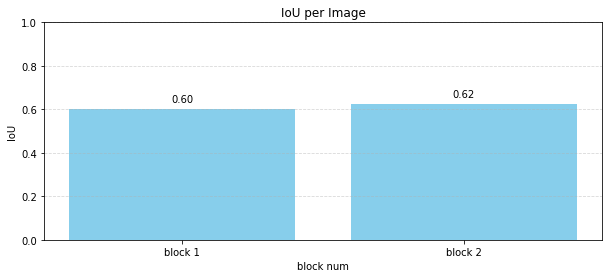

In [186]:
item = get_one(ds_test)
ious = compare_cam(item)

In [187]:
model_ious.append(ious)

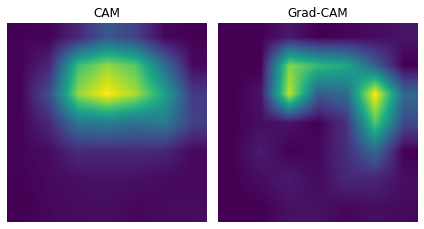

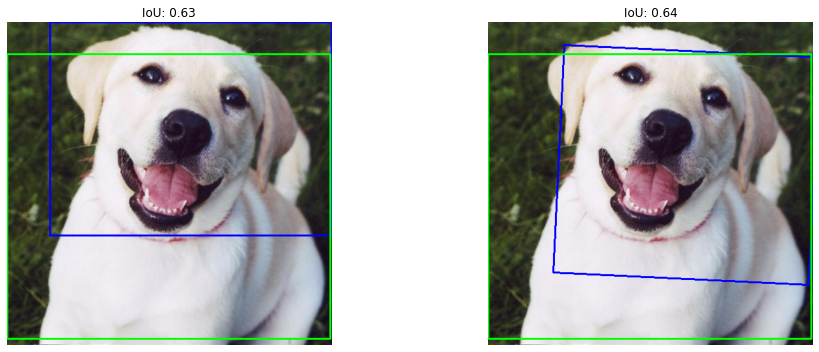

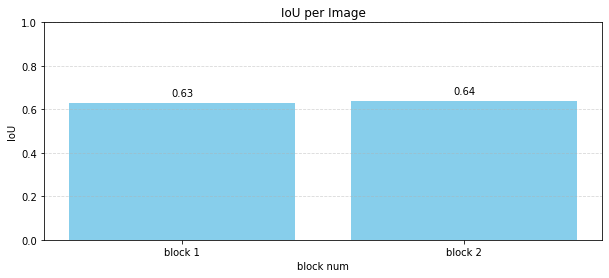

In [229]:
item = get_one(ds_test)
ious = compare_cam(item)

In [230]:
model_ious.append(ious)

In [232]:
print(len(model_ious))
print(model_ious)

10
[[0.4567627034600222, 0.38264814294093], [0.6222441281712732, 0.6368483358351965], [0.38780063718073915, 0.4064023227941895], [0.7202284909826993, 0.394675955767338], [0.7858043921680016, 0.382342205335765], [0.7580236327062791, 0.685568897786613], [0.6118173673362622, 0.40686620225086384], [0.34322929318023276, 0.1622911725574615], [0.6031413945287859, 0.6247544543911164], [0.6299920421503213, 0.6390887464782957]]


In [234]:
avg1, avg2 = 0.0, 0.0
for m in model_ious:
    avg1 += m[0]
    avg2 += m[1]
    
n = len(model_ious)
avg1 /= n
avg2 /= n
print(avg1, avg2)

0.5919044081864616 0.472148643613777


| |CAM|Grad-CAM|
|:---:|:---:|:---:|
|IoU average|0.59|0.47|

- Test데이터셋에서 무작위로 10개의 이미지를 뽑아 CAM과 Grad-CAM의 IoU값을 비교해봄
- CAM이 Grad-CAM보다 더 좋은 성능을 보임

회고
- 왜 CAM이 더 좋을까? Grad-CAM은 분명 CAM의 문제점을 보완하기 위해 나온 방법이라고 했는데
- ground truth bounding box가 마음에 들지 않음 bounding box에 강아지보다 배경이 더 많이 들어간 데이터가 많음